<h1 align="center"><font color='Red'>Predictive Maintenance for Industrial Machinery</font></h1>

#### Name: Rishana
#### Organization: Entri Elevate
#### Date: 13.05.2024

#### <b><font color='brown'> PROBLEM STATEMENT:</font></b>

This project addresses the need for proactive maintenance strategies in industrial settings by
 developing a machine-learning model to predict equipment failures based on historical sensor
 data. By analyzing patterns in sensor readings, the model aims to forecast potential failures
 before they occur, enabling timely maintenance interventions. The goal is to minimize
 downtime, optimize resource allocation, and reduce maintenance costs by transitioning from
 reactive to proactive maintenance practices. Through this approach, manufacturing plants can
 improve operational efficiency, maximize equipment uptime, and enhance overall productivity.

#### <b><font color='brown'> OVERVIEW</font></b>

Industrial machinery often experiences unforeseen breakdowns, leading to costly downtime and inefficiencies in production processes. Predictive maintenance aims to address this issue by leveraging machine learning techniques to forecast equipment failures based on historical sensor data. By analyzing patterns in sensor readings, the model can predict potential failures before they occur, enabling proactive maintenance interventions.

#### <b><font color='brown'> RELEVANCE</font></b>

In the manufacturing sector, minimizing downtime and optimizing resource allocation are critical for maximizing productivity and profitability. Predictive maintenance offers a proactive approach to equipment management, allowing companies to schedule maintenance activities strategically, reduce unplanned downtime, and minimize repair costs.

#### <b><font color='brown'> OBJECTIVE OF THE PROJECT</font></b>

The primary objective of this project is to develop a robust machine-learning model for predictive maintenance in industrial machinery operations. By accurately predicting equipment failures, the model aims to:

- Reduce unplanned downtime
- Optimize resource allocation
- Minimize maintenance costs
- Enhance operational efficiency and productivity

#### <b><font color='brown'> BACKGROUND STUDY</font></b>

Prior research and studies have demonstrated the effectiveness of predictive maintenance in various industries, including manufacturing, aviation, and automotive. Machine learning algorithms such as logistic regression, decision trees, random forests, and support vector machines have been successfully applied to predict equipment failures based on sensor data. By building upon existing knowledge and methodologies, this project aims to develop a tailored predictive maintenance solution for industrial machinery.

#### <b><font color='brown'>LIBRARIES USED:</font></b>

Pandas, NumPy, Matplotlib, Seaborn

#### <b><font color='brown'>IMPORTING MODULES:</font></b>

In [1]:
#importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import math
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [2]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

#### <b><font color='brown'>LOADING DATASET:</font></b>

In [3]:
#loading data
df=pd.read_csv('Predictive_Maintenance.csv')
df

,Equipment_ID,Sensor_1,Sensor_2,Sensor_3,Environmental_Temperature,Environmental_Humidity,Production_Volume,Operating_Hours,Error_Code,Equipment_Age,Power_Consumption,Voltage_Fluctuations,Current_Fluctuations,Vibration_Analysis,Temperature_Gradients,Pressure_Levels,Failure_Maintenance_Indicator
0,766,26.80,27.88,0.009,21.4,51,1182,163,1,8,1405,3,2,0.7,23,23,1
1,964,23.99,26.31,0.006,21.9,53,1103,146,1,6,1500,4,4,0.5,24,22,1
2,45,24.17,26.93,0.003,22.2,60,1413,292,1,2,1589,5,2,0.5,21,24,0
3,53,27.66,20.30,0.010,24.6,50,1435,163,1,5,1502,8,4,0.6,24,23,0
4,797,23.30,27.03,0.007,24.2,44,1358,227,1,10,1409,8,5,0.4,22,19,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,976,26.56,24.17,0.003,20.4,56,1167,245,1,1,1483,7,2,0.7,24,18,1
9996,450,28.68,21.50,0.001,23.3,47,1236,259,0,2,1471,6,1,0.5,20,21,0
9997,354,27.00,25.46,0.007,24.7,58,1225,245,0,4,1425,8,2,0.6,19,22,0
9998,402,25.91,29.98,0.007,21.1,55,1471,213,1,3,1466,8,2,0.4,23,24,0


#### <b><font color='brown'>DATA EXPLORATION</font></b>

In [4]:
# To get info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Equipment_ID                   10000 non-null  int64  
 1   Sensor_1                       10000 non-null  float64
 2   Sensor_2                       10000 non-null  float64
 3   Sensor_3                       10000 non-null  float64
 4   Environmental_Temperature      10000 non-null  float64
 5   Environmental_Humidity         10000 non-null  int64  
 6   Production_Volume              10000 non-null  int64  
 7   Operating_Hours                10000 non-null  int64  
 8   Error_Code                     10000 non-null  int64  
 9   Equipment_Age                  10000 non-null  int64  
 10  Power_Consumption              10000 non-null  int64  
 11  Voltage_Fluctuations           10000 non-null  int64  
 12  Current_Fluctuations           10000 non-null  

In [5]:
df.shape

(10000, 17)

In [6]:
#To display the initial rows
df.head()

,Equipment_ID,Sensor_1,Sensor_2,Sensor_3,Environmental_Temperature,Environmental_Humidity,Production_Volume,Operating_Hours,Error_Code,Equipment_Age,Power_Consumption,Voltage_Fluctuations,Current_Fluctuations,Vibration_Analysis,Temperature_Gradients,Pressure_Levels,Failure_Maintenance_Indicator
0,766,26.80,27.88,0.009,21.4,51,1182,163,1,8,1405,3,2,0.7,23,23,1
1,964,23.99,26.31,0.006,21.9,53,1103,146,1,6,1500,4,4,0.5,24,22,1
2,45,24.17,26.93,0.003,22.2,60,1413,292,1,2,1589,5,2,0.5,21,24,0
3,53,27.66,20.30,0.010,24.6,50,1435,163,1,5,1502,8,4,0.6,24,23,0
4,797,23.30,27.03,0.007,24.2,44,1358,227,1,10,1409,8,5,0.4,22,19,0


In [7]:
#To display the final rows of the DataFrame
df.tail()

,Equipment_ID,Sensor_1,Sensor_2,Sensor_3,Environmental_Temperature,Environmental_Humidity,Production_Volume,Operating_Hours,Error_Code,Equipment_Age,Power_Consumption,Voltage_Fluctuations,Current_Fluctuations,Vibration_Analysis,Temperature_Gradients,Pressure_Levels,Failure_Maintenance_Indicator
9995,976,26.56,24.17,0.003,20.4,56,1167,245,1,1,1483,7,2,0.7,24,18,1
9996,450,28.68,21.50,0.001,23.3,47,1236,259,0,2,1471,6,1,0.5,20,21,0
9997,354,27.00,25.46,0.007,24.7,58,1225,245,0,4,1425,8,2,0.6,19,22,0
9998,402,25.91,29.98,0.007,21.1,55,1471,213,1,3,1466,8,2,0.4,23,24,0
9999,115,28.89,29.24,0.004,22.1,49,1405,246,0,6,1530,8,5,0.5,21,19,1


In [8]:
#To display column labels of DataFrame
df.columns

Index(['Equipment_ID', 'Sensor_1', 'Sensor_2', 'Sensor_3',
       'Environmental_Temperature', 'Environmental_Humidity',
       'Production_Volume', 'Operating_Hours', 'Error_Code', 'Equipment_Age',
       'Power_Consumption', 'Voltage_Fluctuations', 'Current_Fluctuations',
       'Vibration_Analysis', 'Temperature_Gradients', 'Pressure_Levels',
       'Failure_Maintenance_Indicator'],
      dtype='object')

In [9]:
#To display the statistical analysis for numerical columns within the DataFrame
print("\nStatistical analysis on numerical features:")
df.describe()


Statistical analysis on numerical features:


,Equipment_ID,Sensor_1,Sensor_2,Sensor_3,Environmental_Temperature,Environmental_Humidity,Production_Volume,Operating_Hours,Error_Code,Equipment_Age,Power_Consumption,Voltage_Fluctuations,Current_Fluctuations,Vibration_Analysis,Temperature_Gradients,Pressure_Levels,Failure_Maintenance_Indicator
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000
mean,500.264200,24.992639,24.949423,0.005506,22.513410,49.999200,1247.552800,200.133400,0.502100,5.505100,1499.44780,5.515000,3.003700,0.549510,21.018300,20.99940,0.490400
std,289.690687,2.873549,2.866201,0.002611,1.428719,6.077491,143.941752,58.221121,0.500021,2.877465,58.02759,1.709698,1.419186,0.095198,1.995586,1.99915,0.499933
min,1.000000,20.000000,20.000000,0.001000,20.000000,40.000000,1000.000000,100.000000,0.000000,1.000000,1400.00000,3.000000,1.000000,0.400000,18.000000,18.00000,0.000000
25%,248.000000,22.520000,22.460000,0.003000,21.300000,45.000000,1124.000000,150.000000,0.000000,3.000000,1449.00000,4.000000,2.000000,0.500000,19.000000,19.00000,0.000000
50%,495.000000,25.005000,24.930000,0.006000,22.500000,50.000000,1246.000000,200.000000,1.000000,5.000000,1499.00000,6.000000,3.000000,0.500000,21.000000,21.00000,0.000000
75%,755.000000,27.460000,27.450000,0.008000,23.700000,55.000000,1370.000000,250.000000,1.000000,8.000000,1550.00000,7.000000,4.000000,0.600000,23.000000,23.00000,1.000000
max,1000.000000,30.000000,30.000000,0.010000,25.000000,60.000000,1500.000000,300.000000,1.000000,10.000000,1600.00000,8.000000,5.000000,0.700000,24.000000,24.00000,1.000000


In [10]:
#unique value counts
for column in df.columns:
    unique_values_count = df[column].nunique()
    print(f"Unique values count for {column}: {unique_values_count}")

Unique values count for Equipment_ID: 1000
Unique values count for Sensor_1: 1001
Unique values count for Sensor_2: 1001
Unique values count for Sensor_3: 10
Unique values count for Environmental_Temperature: 51
Unique values count for Environmental_Humidity: 21
Unique values count for Production_Volume: 501
Unique values count for Operating_Hours: 201
Unique values count for Error_Code: 2
Unique values count for Equipment_Age: 10
Unique values count for Power_Consumption: 201
Unique values count for Voltage_Fluctuations: 6
Unique values count for Current_Fluctuations: 5
Unique values count for Vibration_Analysis: 4
Unique values count for Temperature_Gradients: 7
Unique values count for Pressure_Levels: 7
Unique values count for Failure_Maintenance_Indicator: 2


In [11]:
print(df['Error_Code'].value_counts())
print(df['Equipment_Age'].value_counts())

Error_Code
1    5021
0    4979
Name: count, dtype: int64
Equipment_Age
8     1032
3     1028
10    1016
5     1008
4     1006
1     1005
9      989
7      977
2      973
6      966
Name: count, dtype: int64


In [12]:
print(df['Voltage_Fluctuations'].value_counts())
print(df['Current_Fluctuations'].value_counts())
print(df['Vibration_Analysis'].value_counts())

Voltage_Fluctuations
8    1704
5    1700
6    1667
3    1662
7    1654
4    1613
Name: count, dtype: int64
Current_Fluctuations
5    2050
3    2017
1    2002
2    1995
4    1936
Name: count, dtype: int64
Vibration_Analysis
0.5    3428
0.6    3291
0.7    1647
0.4    1634
Name: count, dtype: int64


In [13]:
print(df['Temperature_Gradients'].value_counts())
print(df['Pressure_Levels'].value_counts())
print(df['Failure_Maintenance_Indicator'].value_counts())

Temperature_Gradients
21    1450
23    1447
22    1439
24    1433
20    1420
18    1407
19    1404
Name: count, dtype: int64
Pressure_Levels
23    1468
21    1456
20    1443
19    1426
18    1423
24    1419
22    1365
Name: count, dtype: int64
Failure_Maintenance_Indicator
0    5096
1    4904
Name: count, dtype: int64


In [14]:
pd.crosstab(df['Failure_Maintenance_Indicator'],df['Sensor_1'],margins='True')

Sensor_1,20.0,20.01,20.02,20.03,20.04,20.05,20.06,20.07,20.08,20.09,...,29.92,29.93,29.94,29.95,29.96,29.97,29.98,29.99,30.0,All
Failure_Maintenance_Indicator,,,,,,,,,,,,,,,,,,,,,
0,2,10,5,5,5,6,3,4,6,8,...,5,3,7,4,5,2,8,6,3,5096
1,4,6,8,7,1,2,5,2,2,6,...,2,8,3,7,5,6,6,3,4,4904
All,6,16,13,12,6,8,8,6,8,14,...,7,11,10,11,10,8,14,9,7,10000


In [15]:
pd.crosstab(df['Failure_Maintenance_Indicator'],df['Sensor_2'],margins='True')

Sensor_2,20.0,20.01,20.02,20.03,20.04,20.05,20.06,20.07,20.08,20.09,...,29.92,29.93,29.94,29.95,29.96,29.97,29.98,29.99,30.0,All
Failure_Maintenance_Indicator,,,,,,,,,,,,,,,,,,,,,
0,4,6,6,7,3,2,6,8,5,0,...,5,5,5,9,8,8,7,3,3,5096
1,3,6,11,4,4,3,6,6,3,8,...,1,6,1,4,7,1,5,5,4,4904
All,7,12,17,11,7,5,12,14,8,8,...,6,11,6,13,15,9,12,8,7,10000


In [16]:
pd.crosstab(df['Failure_Maintenance_Indicator'],df['Sensor_3'],margins='True')

Sensor_3,0.001,0.002,0.003,0.004,0.005,0.006,0.007,0.008,0.009,0.01,All
Failure_Maintenance_Indicator,,,,,,,,,,,
0,284,541,562,594,573,576,552,579,570,265,5096
1,257,535,561,537,537,569,561,549,518,280,4904
All,541,1076,1123,1131,1110,1145,1113,1128,1088,545,10000


In [17]:
pd.crosstab(df['Failure_Maintenance_Indicator'],df['Pressure_Levels'],margins='True')

Pressure_Levels,18,19,20,21,22,23,24,All
Failure_Maintenance_Indicator,,,,,,,,
0,714,718,759,729,712,734,730,5096
1,709,708,684,727,653,734,689,4904
All,1423,1426,1443,1456,1365,1468,1419,10000


In [18]:
pd.crosstab(df['Failure_Maintenance_Indicator'],df['Temperature_Gradients'],margins='True')

Temperature_Gradients,18,19,20,21,22,23,24,All
Failure_Maintenance_Indicator,,,,,,,,
0,721,724,717,763,713,728,730,5096
1,686,680,703,687,726,719,703,4904
All,1407,1404,1420,1450,1439,1447,1433,10000


In [19]:
pd.crosstab(df['Failure_Maintenance_Indicator'],df['Error_Code'],margins='True')

Error_Code,0,1,All
Failure_Maintenance_Indicator,,,
0,2539,2557,5096
1,2440,2464,4904
All,4979,5021,10000


In [20]:
numerical_features=['Sensor_1', 'Sensor_2', 'Sensor_3',
       'Environmental_Temperature', 'Environmental_Humidity',
       'Production_Volume', 'Operating_Hours','Error_Code', 'Equipment_Age',
       'Power_Consumption', 'Voltage_Fluctuations', 'Current_Fluctuations',
       'Vibration_Analysis', 'Temperature_Gradients', 'Pressure_Levels']

#### <b><font color='brown'>DATA PREPROCESSING</font></b>

In [21]:
# Dropping Duplicates
df=df.drop_duplicates()
df=df.reset_index(drop=True)
df

,Equipment_ID,Sensor_1,Sensor_2,Sensor_3,Environmental_Temperature,Environmental_Humidity,Production_Volume,Operating_Hours,Error_Code,Equipment_Age,Power_Consumption,Voltage_Fluctuations,Current_Fluctuations,Vibration_Analysis,Temperature_Gradients,Pressure_Levels,Failure_Maintenance_Indicator
0,766,26.80,27.88,0.009,21.4,51,1182,163,1,8,1405,3,2,0.7,23,23,1
1,964,23.99,26.31,0.006,21.9,53,1103,146,1,6,1500,4,4,0.5,24,22,1
2,45,24.17,26.93,0.003,22.2,60,1413,292,1,2,1589,5,2,0.5,21,24,0
3,53,27.66,20.30,0.010,24.6,50,1435,163,1,5,1502,8,4,0.6,24,23,0
4,797,23.30,27.03,0.007,24.2,44,1358,227,1,10,1409,8,5,0.4,22,19,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,976,26.56,24.17,0.003,20.4,56,1167,245,1,1,1483,7,2,0.7,24,18,1
9996,450,28.68,21.50,0.001,23.3,47,1236,259,0,2,1471,6,1,0.5,20,21,0
9997,354,27.00,25.46,0.007,24.7,58,1225,245,0,4,1425,8,2,0.6,19,22,0
9998,402,25.91,29.98,0.007,21.1,55,1471,213,1,3,1466,8,2,0.4,23,24,0


There is no duplicates

In [22]:
#Checking is there any null value
df.isnull().sum()

Equipment_ID                     0
Sensor_1                         0
Sensor_2                         0
Sensor_3                         0
Environmental_Temperature        0
Environmental_Humidity           0
Production_Volume                0
Operating_Hours                  0
Error_Code                       0
Equipment_Age                    0
Power_Consumption                0
Voltage_Fluctuations             0
Current_Fluctuations             0
Vibration_Analysis               0
Temperature_Gradients            0
Pressure_Levels                  0
Failure_Maintenance_Indicator    0
dtype: int64

This dataset doesn't contain any null values

In [23]:
#Dropping irrelevant column 'Equipment_ID'
df.drop(["Equipment_ID"],axis=1,inplace=True)

#### <b><font color='brown'>VISUALIZATION</font></b>

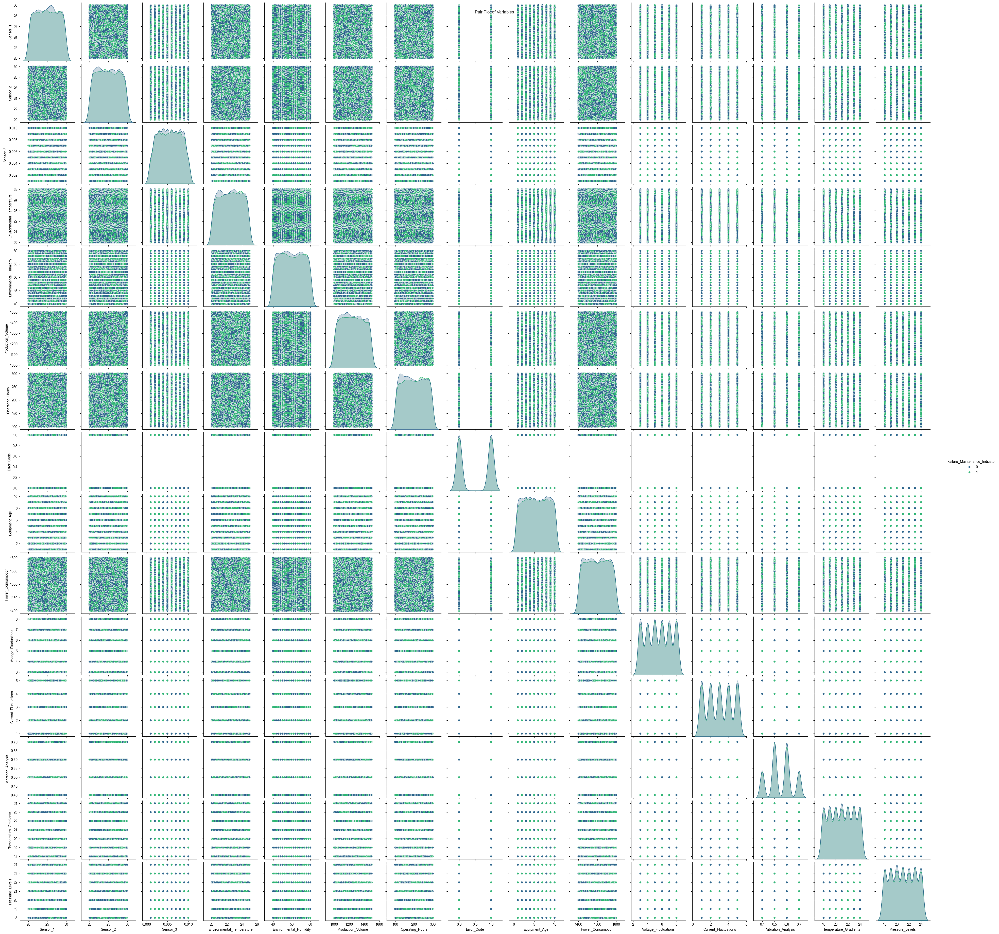

In [24]:
#pair plot
sns.pairplot(df, hue='Failure_Maintenance_Indicator', palette='viridis')
sns.set_style("whitegrid")
plt.suptitle("Pair Plot of Variables")
plt.show()

On the diagonal of the matrix, there are histograms that show the distribution of individual variables.
Off-diagonal plots are scatter plots that display the relationship between two variables. 

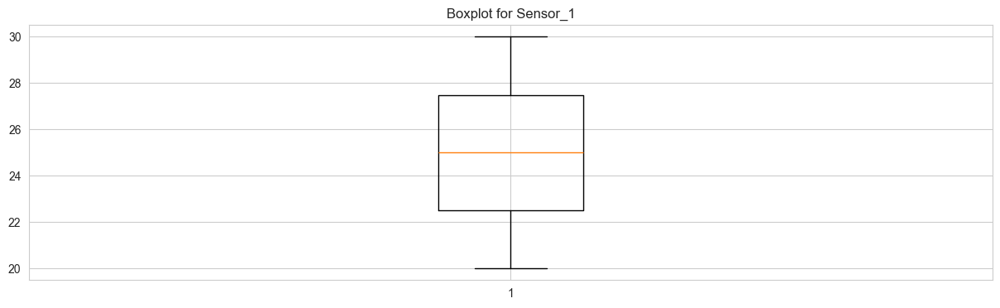

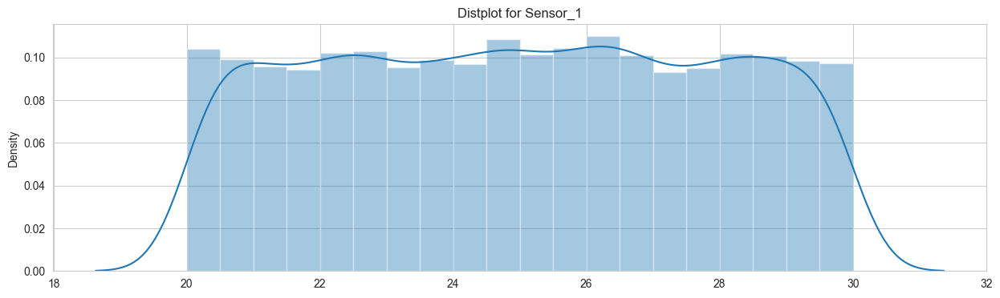

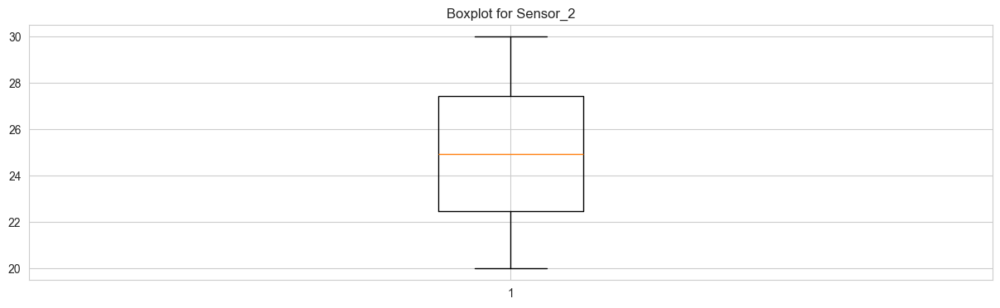

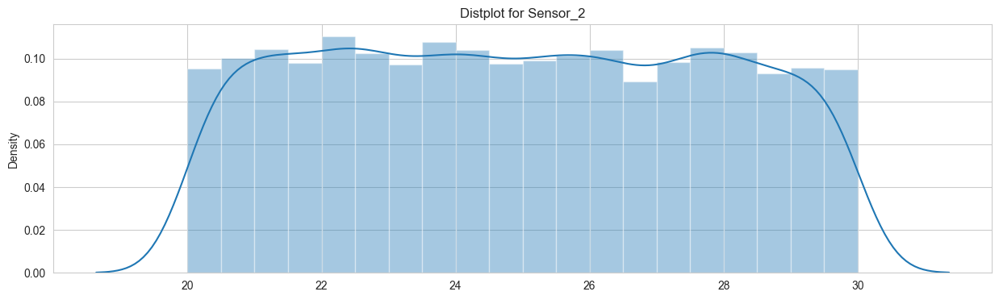

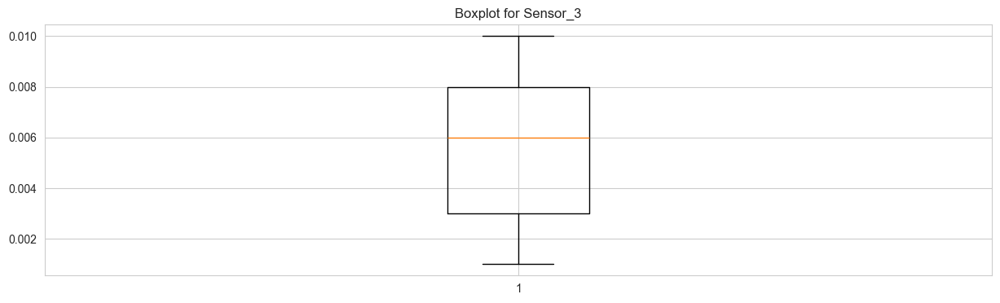

...

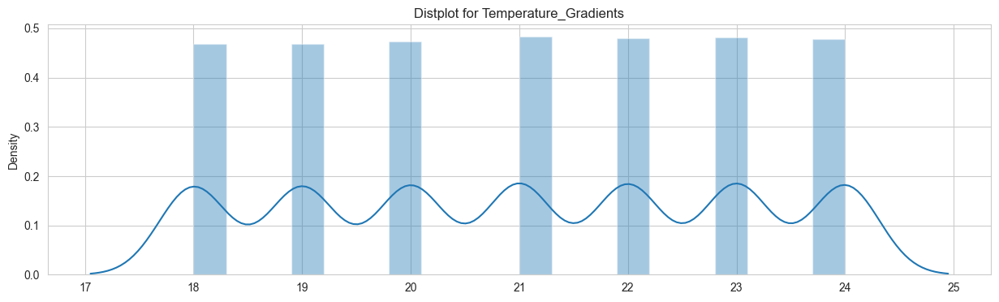

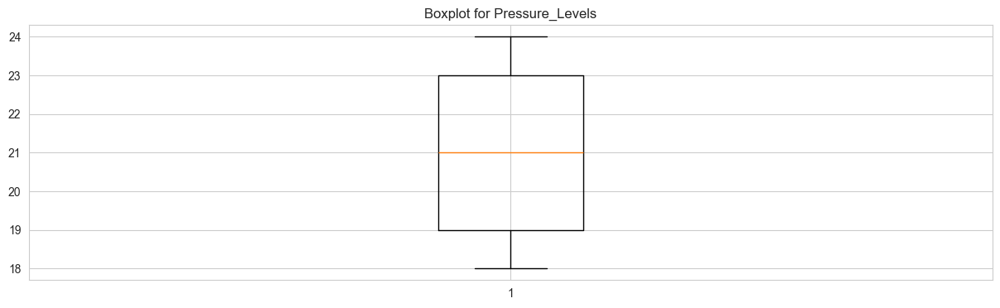

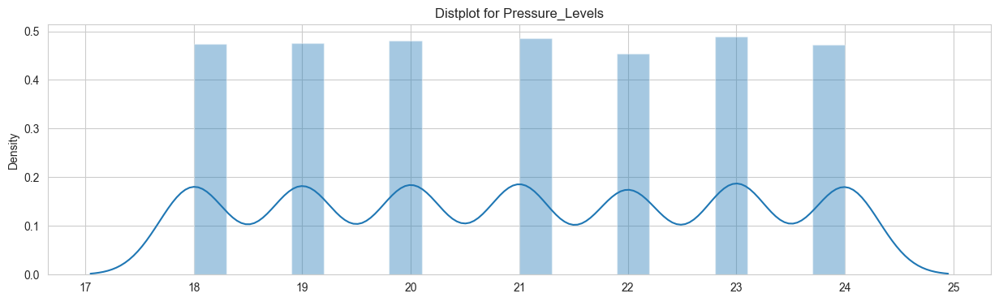

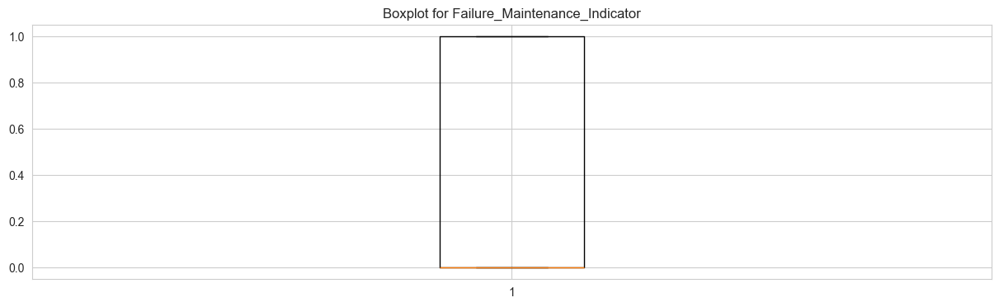

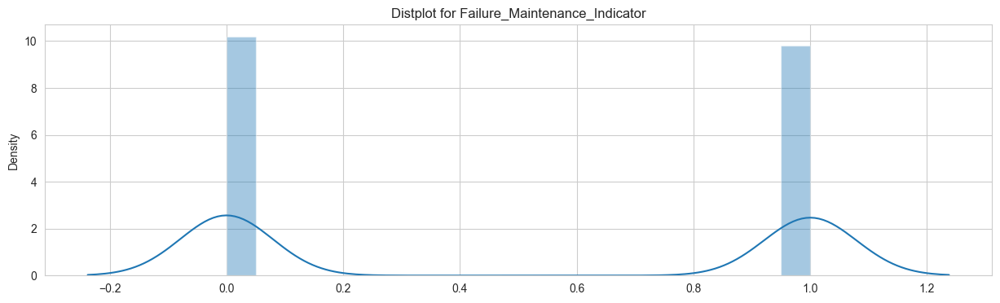

In [25]:
# Boxplot and histogram of each feature
for feature in df:
    # Extracting the feature values
    x = df[feature].values

    # Boxplot
    plt.figure(figsize=(15, 4))
    plt.boxplot(x)
    plt.title('Boxplot for ' + feature)

    # Histogram with distplot
    plt.figure(figsize=(15, 4))
    sns.distplot(x, bins=20)
    plt.title('Distplot for ' + feature)

    # Display
    plt.show()

 Boxplot and distplot aren't showing the presence of outliers

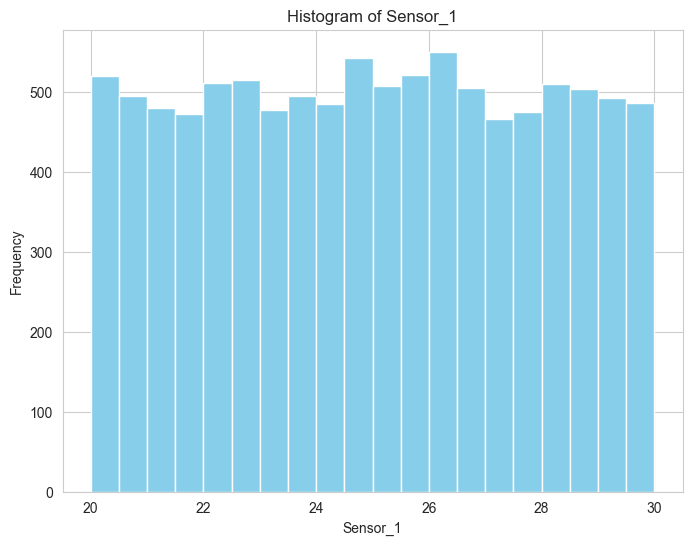

In [26]:
# Histogram of a numerical feature
plt.figure(figsize=(8, 6))
plt.hist(df['Sensor_1'], bins=20, color='skyblue')
plt.title('Histogram of Sensor_1')
plt.xlabel('Sensor_1')
plt.ylabel('Frequency')
plt.show()

The data distribution is relatively uniform across the bins for Sensor_1

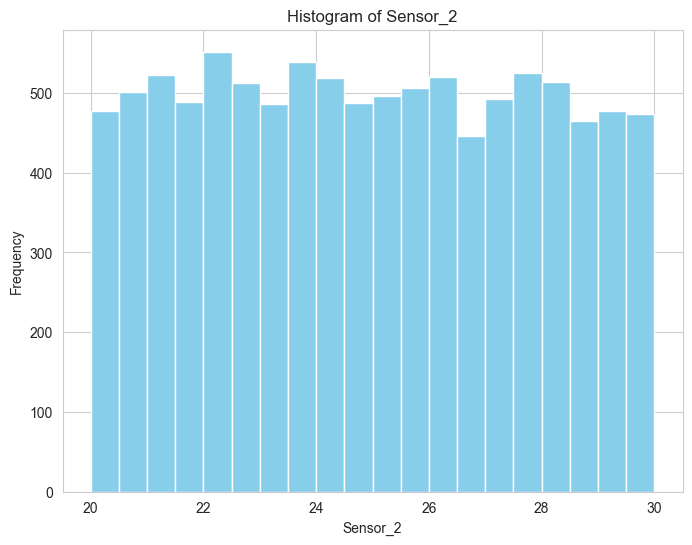

In [27]:
plt.figure(figsize=(8, 6))
plt.hist(df['Sensor_2'], bins=20, color='skyblue')
plt.title('Histogram of Sensor_2')
plt.xlabel('Sensor_2')
plt.ylabel('Frequency')
plt.show()

The data distribution is relatively uniform across the bins for Sensor_2

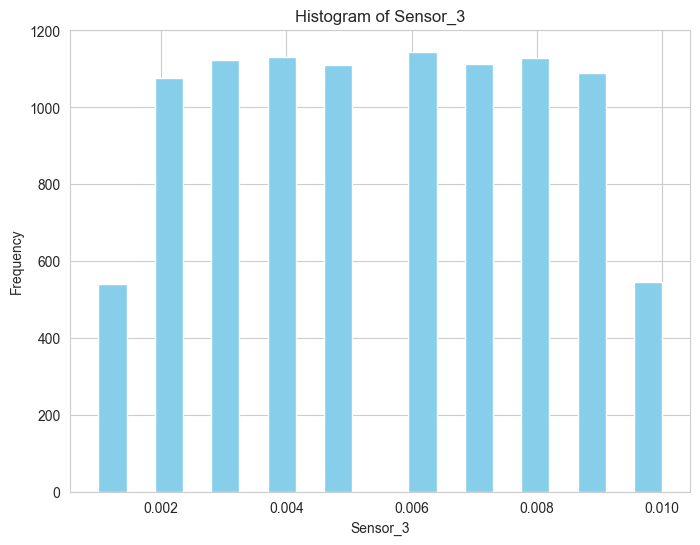

In [28]:
plt.figure(figsize=(8, 6))
plt.hist(df['Sensor_3'], bins=20, color='skyblue')
plt.title('Histogram of Sensor_3')
plt.xlabel('Sensor_3')
plt.ylabel('Frequency')
plt.show()

The data distribution is relatively uniform across most of the bins, except for those at the extremes (the first bin around 0.002 and the last bin near 0.010), which have notably lower frequencies.

The highest frequency of data points is around the bins from 0.004 to 0.008.

This uniform distribution, apart from the lower extreme bins, could suggest that Sensor_3 generally records most of its data within this central range under normal operating conditions.

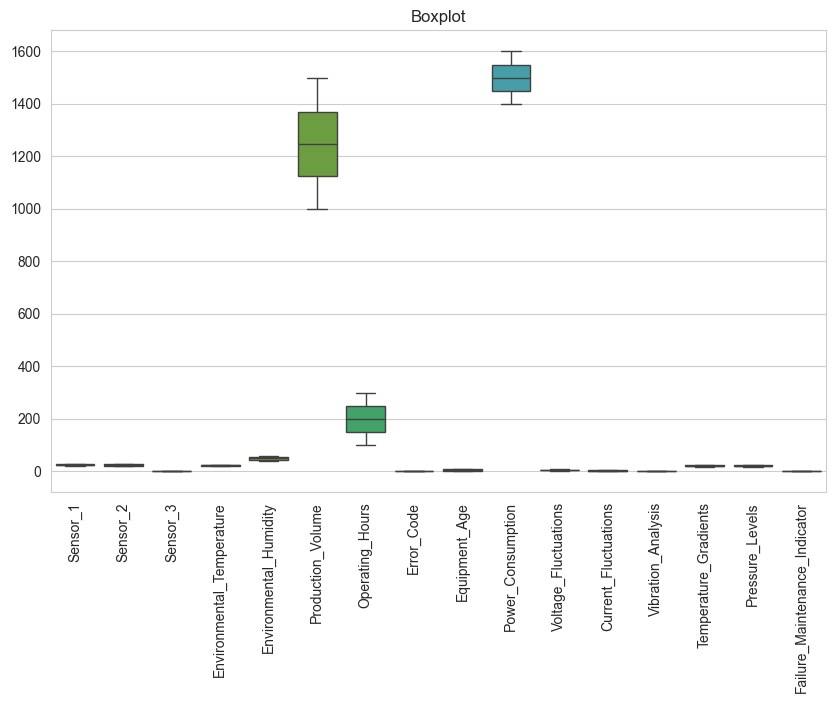

In [29]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df)
plt.title('Boxplot')
plt.xticks(rotation=90)
plt.show()

The boxplots show the median (the line within the box), the interquartile range (the box itself), and the whiskers (the lines extending from the box), which indicate variability outside the upper and lower quartiles. Outliers are not visible in this visual

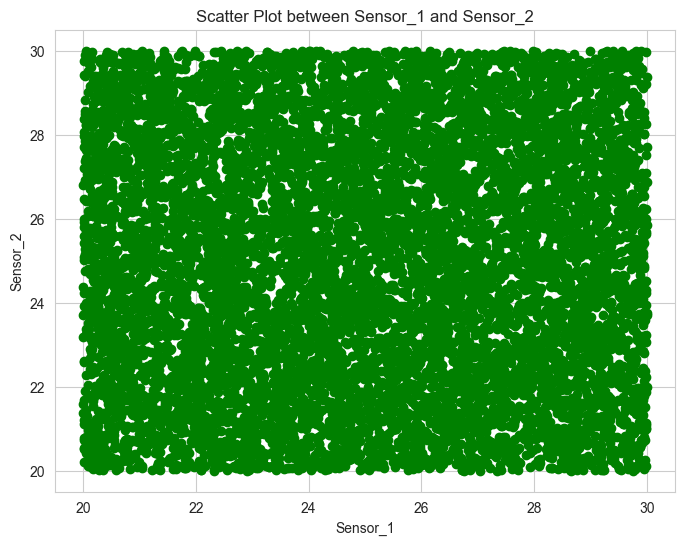

In [30]:
# Scatter plot between Sensor_1 & Sensor_2
plt.figure(figsize=(8, 6))
plt.scatter(df['Sensor_1'], df['Sensor_2'], color='green')
plt.title('Scatter Plot between Sensor_1 and Sensor_2')
plt.xlabel('Sensor_1')
plt.ylabel('Sensor_2')
plt.show()

The scatter plot is dense with points, and there doesn't seem to be a clear pattern or correlation visible from the plot as the points are spread across the entire plotting area.

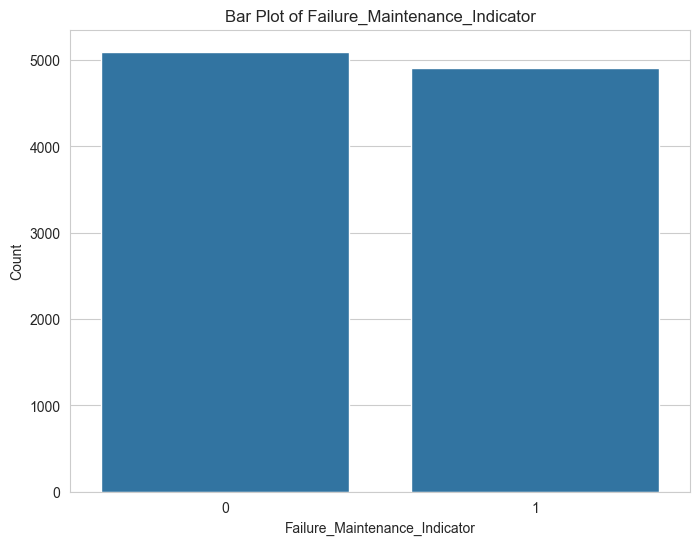

In [31]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Failure_Maintenance_Indicator')
plt.title('Bar Plot of Failure_Maintenance_Indicator')
plt.xlabel('Failure_Maintenance_Indicator')
plt.ylabel('Count')
plt.show()

- Balanced Dataset: The dataset is nearly balanced with a slight predominance of no-failure instances.
- Predictive Modeling: Models trained on this dataset are expected to perform well in predicting both classes due to the balanced nature.

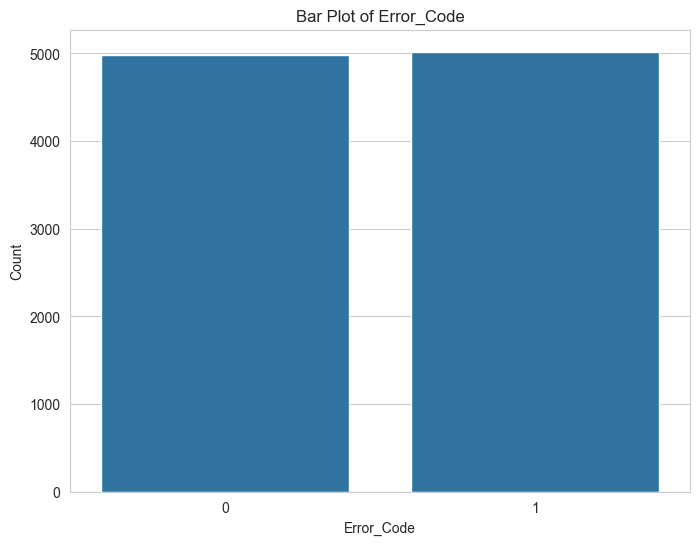

In [32]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Error_Code')
plt.title('Bar Plot of Error_Code')
plt.xlabel('Error_Code')
plt.ylabel('Count')
plt.show()

A nearly equal number of 0s and 1s means the dataset has a balanced representation of error and no-error cases. This is beneficial for training machine learning models as it reduces the risk of bias towards one class.

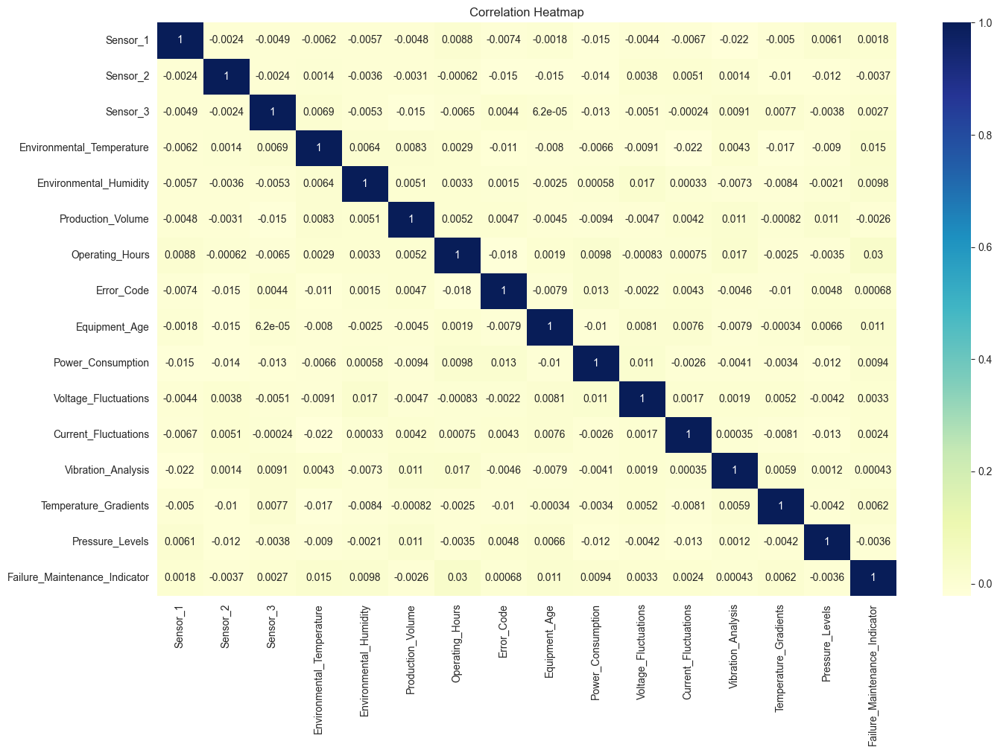

In [33]:
plt.figure(figsize=(16, 10))

#Compute the correlation matrix
cor = df.corr()

#Plot the heatmap
sns.heatmap(cor, annot=True, cmap="YlGnBu")

plt.title('Correlation Heatmap')
# Show the plot
plt.show()

All pairs of variables show correlation values close to 0, indicating no significant relationships.

In [34]:
#CORRELATION ANALYSIS
correlation_matrix=df.corr()
target_correlation=correlation_matrix["Failure_Maintenance_Indicator"].sort_values(ascending=False)
print("Correlation with Failure Maintenance Indicator:")
print(target_correlation)

Correlation with Failure Maintenance Indicator:
Failure_Maintenance_Indicator    1.000000
Operating_Hours                  0.029501
Environmental_Temperature        0.015463
Equipment_Age                    0.010914
Environmental_Humidity           0.009774
Power_Consumption                0.009394
Temperature_Gradients            0.006241
Voltage_Fluctuations             0.003328
Sensor_3                         0.002689
Current_Fluctuations             0.002376
Sensor_1                         0.001830
Error_Code                       0.000681
Vibration_Analysis               0.000426
Production_Volume               -0.002581
Pressure_Levels                 -0.003608
Sensor_2                        -0.003659
Name: Failure_Maintenance_Indicator, dtype: float64


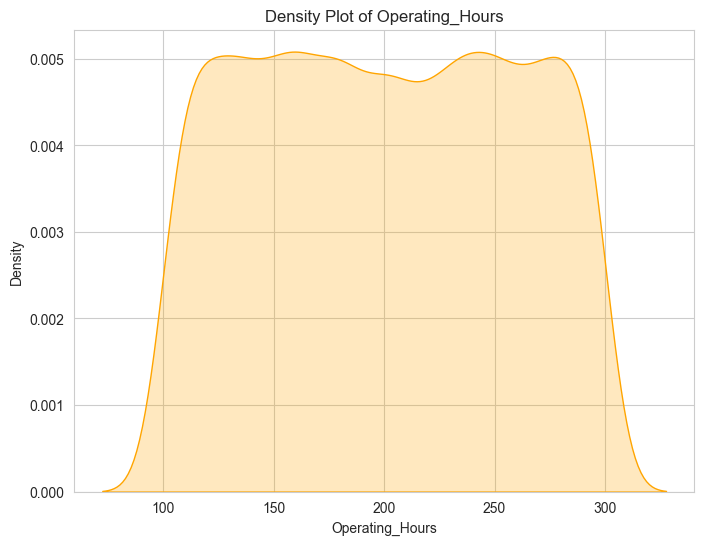

In [35]:
# Density plot
plt.figure(figsize=(8, 6))
sns.kdeplot(df['Operating_Hours'], shade=True, color='orange')
plt.title('Density Plot of Operating_Hours')
plt.xlabel('Operating_Hours')
plt.ylabel('Density')
plt.show()

Every interval within the range of operating hours has approximately the same frequency. This means there is no particular concentration of operating hours at any specific interval.

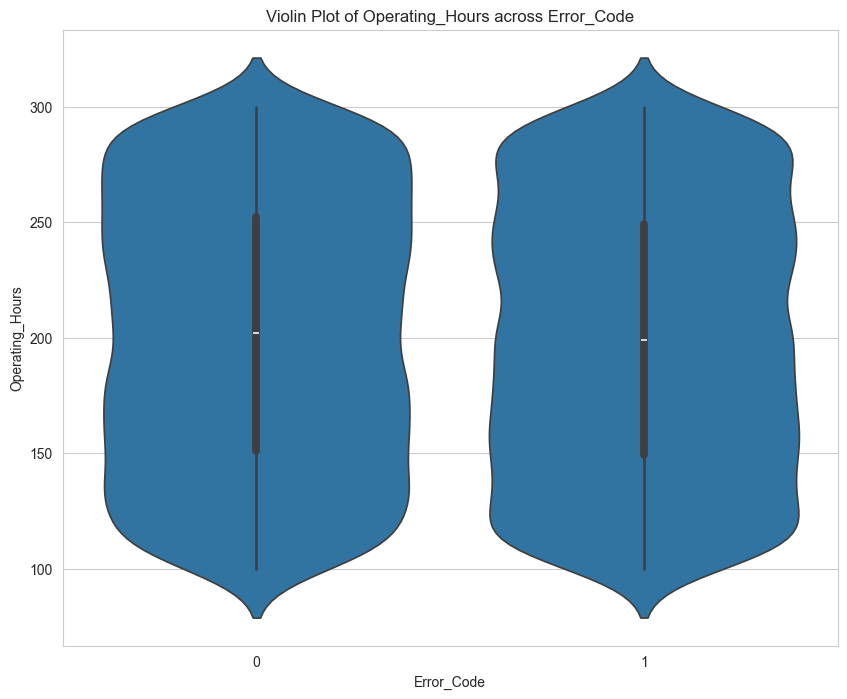

In [36]:
# Violin plot to visualize the distribution of Operating_Hours across Error_Code
plt.figure(figsize=(10, 8))
sns.violinplot(x=df['Error_Code'], y=df['Operating_Hours'])
plt.title('Violin Plot of Operating_Hours across Error_Code')
plt.xlabel('Error_Code')
plt.ylabel('Operating_Hours')
plt.show()

Symmetry in the violins across different error code categories. Symmetry suggests that the distribution of operating hours is balanced or similarly spread across different error codes.

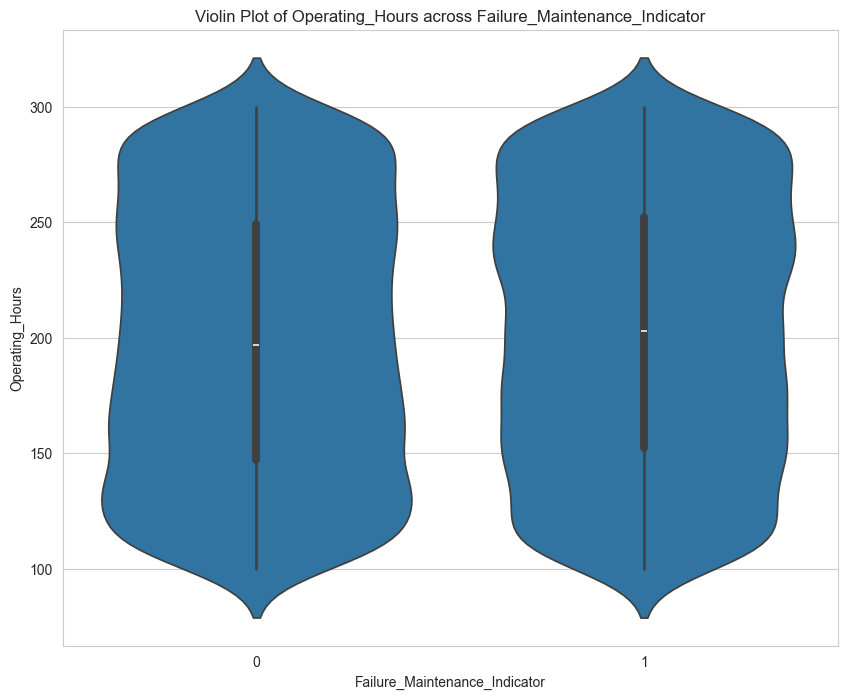

In [37]:
# Violin plot to visualize the distribution of Operating_Hours across Failure_Maintenance_Indicator
plt.figure(figsize=(10, 8))
sns.violinplot(x=df['Failure_Maintenance_Indicator'], y=df['Operating_Hours'])
plt.title('Violin Plot of Operating_Hours across Failure_Maintenance_Indicator')
plt.xlabel('Failure_Maintenance_Indicator')
plt.ylabel('Operating_Hours')
plt.show()

Symmetry suggests similar distributions of operating hours regardless of the need for maintenance due to failure.

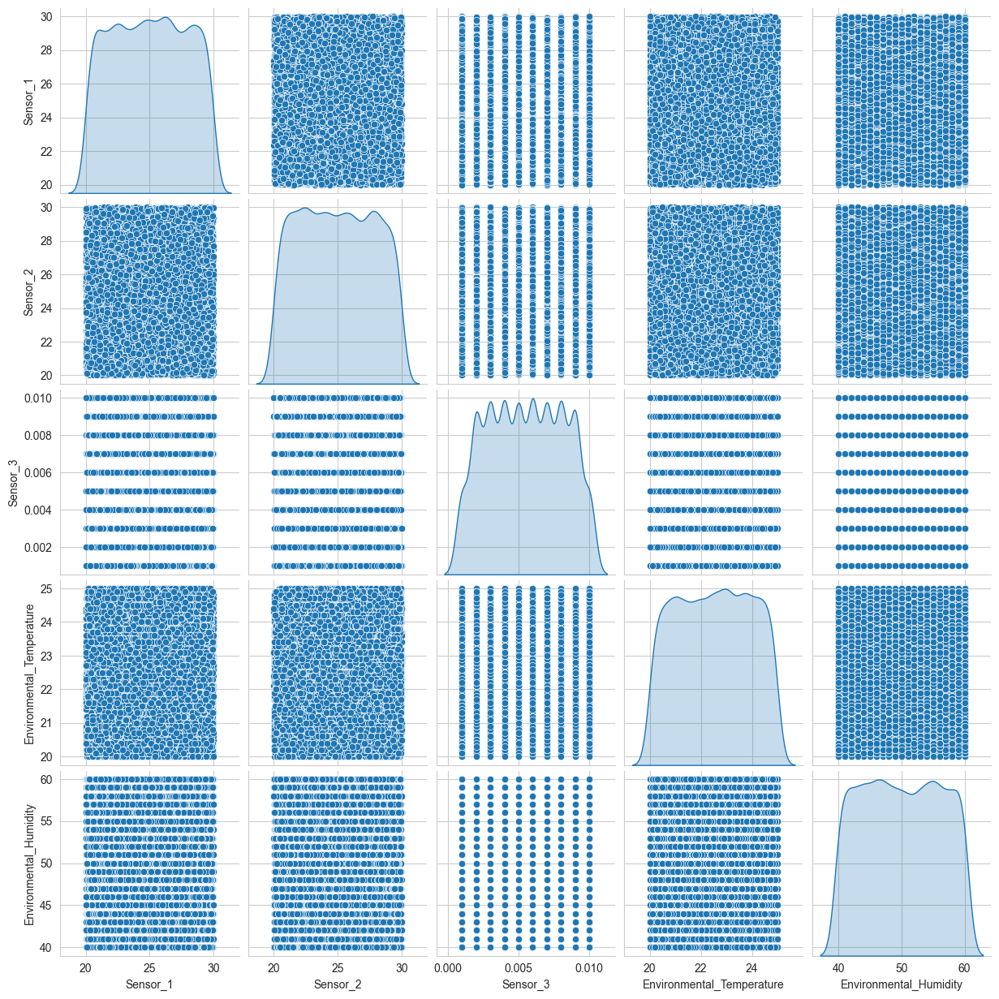

In [38]:
# Pairwise scatter plot matrix
sns.pairplot(df[['Sensor_1', 'Sensor_2', 'Sensor_3', 'Environmental_Temperature', 'Environmental_Humidity']], diag_kind='kde')
plt.show()

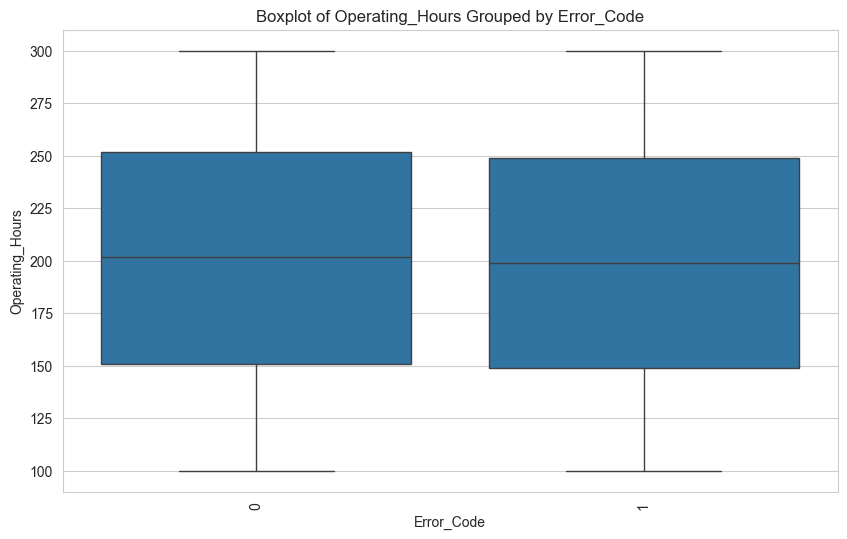

In [39]:
# Boxplot of a Operating_Hours grouped by Error_Code
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['Error_Code'], y=df['Operating_Hours'])
plt.title('Boxplot of Operating_Hours Grouped by Error_Code')
plt.xlabel('Error_Code')
plt.ylabel('Operating_Hours')
plt.xticks(rotation=90)
plt.show()

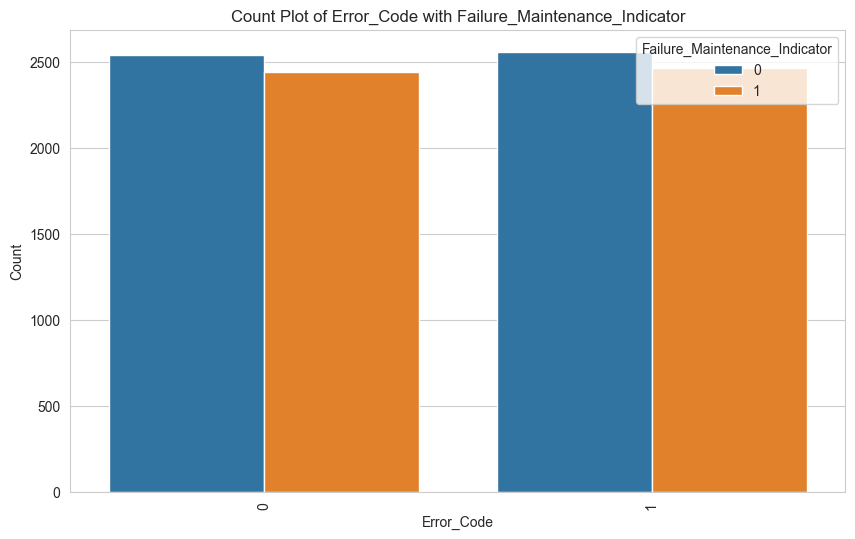

In [40]:
# Bar plot
plt.figure(figsize=(10, 6))
sns.countplot(x=df['Error_Code'], hue=df['Failure_Maintenance_Indicator'])
plt.title('Count Plot of Error_Code with Failure_Maintenance_Indicator')
plt.xlabel('Error_Code')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

Error codes occur with similar frequencies regardless of whether there's a failure maintenance indicator or not. The distribution suggests that error occurrences are not significantly influenced by the need for failure maintenance.

#### <b><font color='brown'>OUTLIER TREATMENT</font></b>

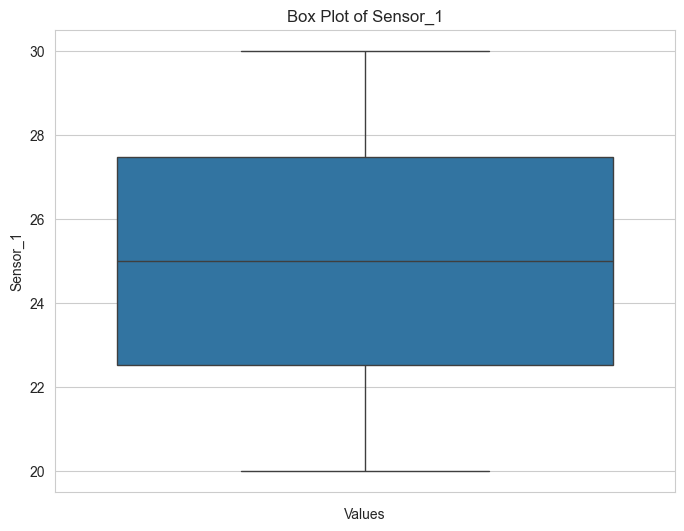

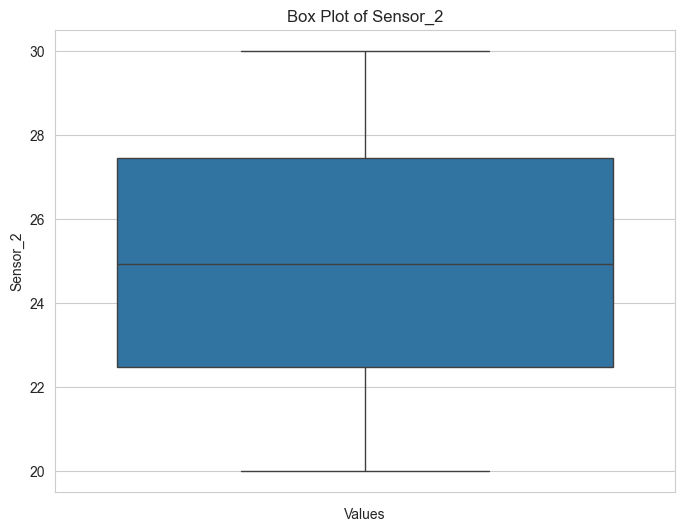

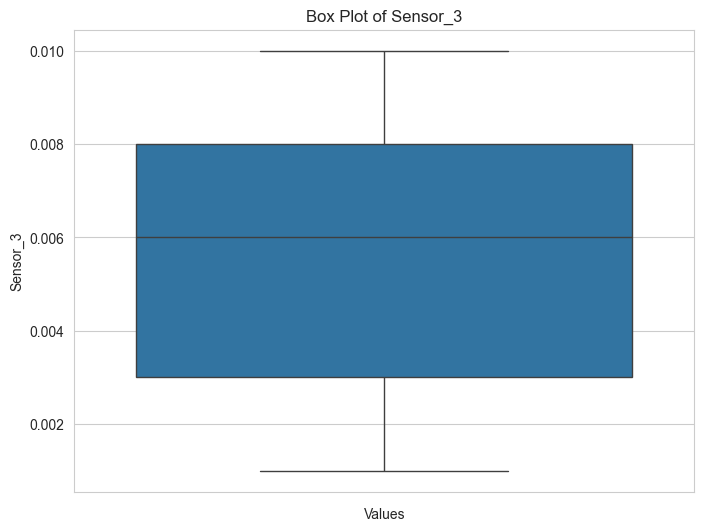

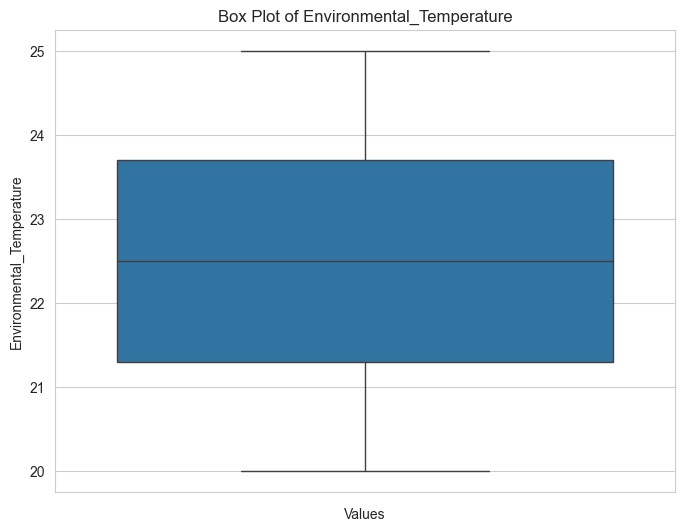

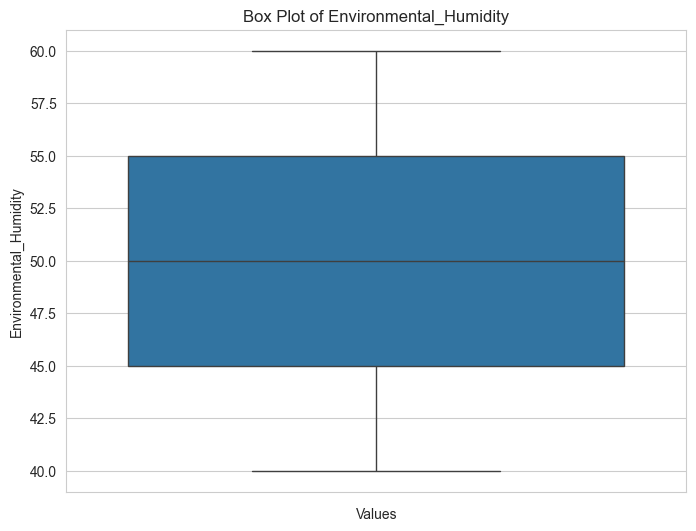

...

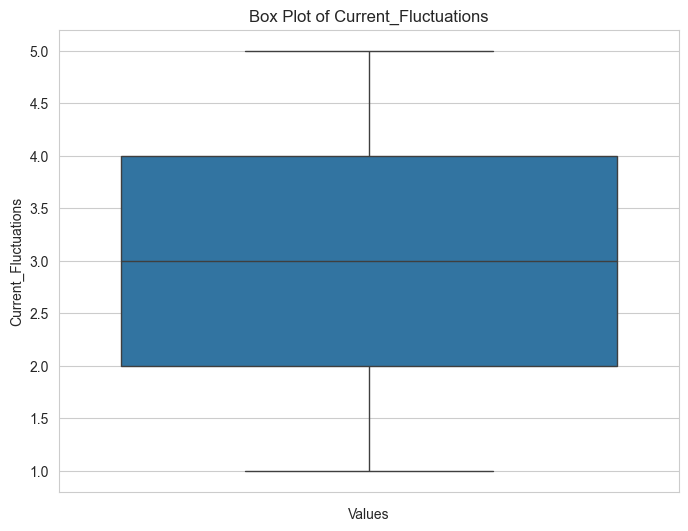

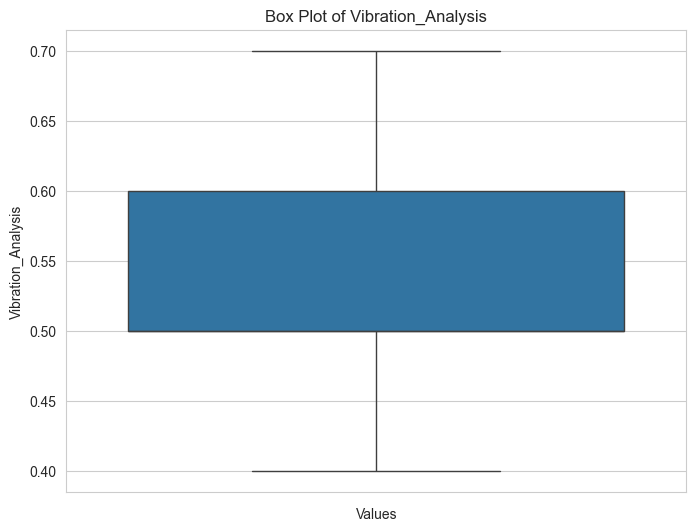

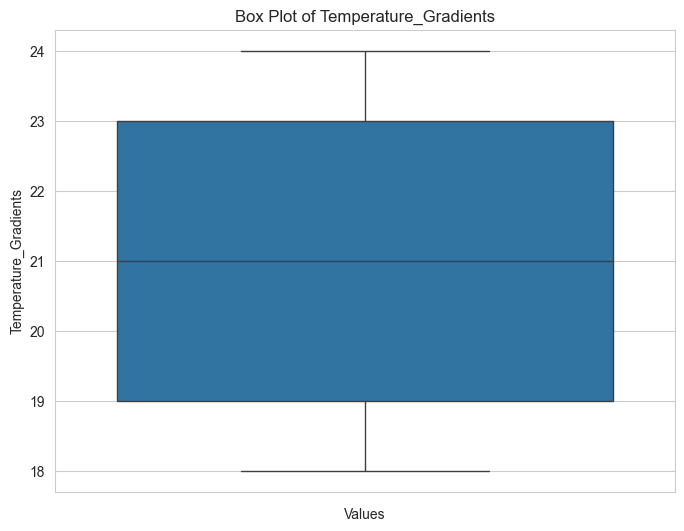

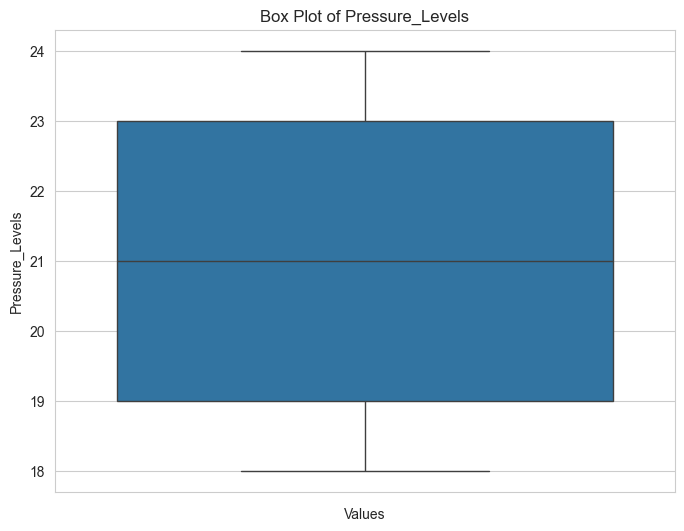

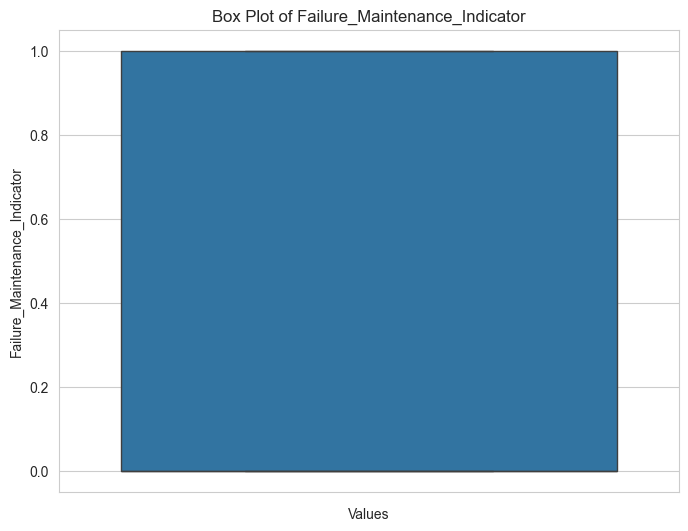

In [41]:
# Box plot for each feature (vertical)
for column in df.columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(y=df[column], orient='v')
    plt.title(f'Box Plot of {column}')
    plt.ylabel(column)
    plt.xlabel('Values')
    plt.show()

In [42]:
# Compute Z-score for selected numeric columns
z_scores = (df[numerical_features] - df[numerical_features].mean()) / df[numerical_features].std()

In [43]:
# Set threshold for outlier detection 
threshold = 3

In [44]:
# Find outliers
outliers = (z_scores > threshold) | (z_scores < -threshold)

In [45]:
# Print outliers
print("Outliers:")
print(outliers.sum())

Outliers:
Sensor_1                     0
Sensor_2                     0
Sensor_3                     0
Environmental_Temperature    0
Environmental_Humidity       0
Production_Volume            0
Operating_Hours              0
Error_Code                   0
Equipment_Age                0
Power_Consumption            0
Voltage_Fluctuations         0
Current_Fluctuations         0
Vibration_Analysis           0
Temperature_Gradients        0
Pressure_Levels              0
dtype: int64


In [46]:
def whisker(col):
    q1,q3=np.percentile(col,[25,75])
    iqr=q3-q1
    lw=q1-1.5*iqr
    uw=q3+1.5*iqr
    return lw,uw

In [47]:
for i in df.select_dtypes(include="number").columns:
    lw,uw=whisker(df[i])
    df[i]=np.where(df[i]<lw,lw,df[i])
    df[i]=np.where(df[i]>uw,uw,df[i])

In [48]:
df.shape

(10000, 16)

This dataset exhibits a notable absence of outliers, indicating a consistent and robust distribution across its variables.

#### <b><font color='brown'>LABEL ENCODING</font></b>

This dataset contains only numerical features, so we can skip label encoding

#### <b><font color='brown'>FEATURE SCALING</font></b>

In [49]:
# Separate features (x) and Target variable (y)
x=df.drop('Failure_Maintenance_Indicator',axis=1)
y=df['Failure_Maintenance_Indicator']

In [50]:
# Scaling Using MinMaxScaler
from sklearn.preprocessing import MinMaxScaler

In [51]:
# Scaling using MinMaxScaler
scaler = MinMaxScaler()

x_scaled = scaler.fit_transform(x)

# Convert the result back to a DataFrame
x_scaled = pd.DataFrame(x_scaled, columns=x.columns)

In [52]:
x_scaled

,Sensor_1,Sensor_2,Sensor_3,Environmental_Temperature,Environmental_Humidity,Production_Volume,Operating_Hours,Error_Code,Equipment_Age,Power_Consumption,Voltage_Fluctuations,Current_Fluctuations,Vibration_Analysis,Temperature_Gradients,Pressure_Levels
0,0.680,0.788,0.888889,0.28,0.55,0.364,0.315,1.0,0.777778,0.025,0.0,0.25,1.000000,0.833333,0.833333
1,0.399,0.631,0.555556,0.38,0.65,0.206,0.230,1.0,0.555556,0.500,0.2,0.75,0.333333,1.000000,0.666667
2,0.417,0.693,0.222222,0.44,1.00,0.826,0.960,1.0,0.111111,0.945,0.4,0.25,0.333333,0.500000,1.000000
3,0.766,0.030,1.000000,0.92,0.50,0.870,0.315,1.0,0.444444,0.510,1.0,0.75,0.666667,1.000000,0.833333
4,0.330,0.703,0.666667,0.84,0.20,0.716,0.635,1.0,1.000000,0.045,1.0,1.00,0.000000,0.666667,0.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.656,0.417,0.222222,0.08,0.80,0.334,0.725,1.0,0.000000,0.415,0.8,0.25,1.000000,1.000000,0.000000
9996,0.868,0.150,0.000000,0.66,0.35,0.472,0.795,0.0,0.111111,0.355,0.6,0.00,0.333333,0.333333,0.500000
9997,0.700,0.546,0.666667,0.94,0.90,0.450,0.725,0.0,0.333333,0.125,1.0,0.25,0.666667,0.166667,0.666667
9998,0.591,0.998,0.666667,0.22,0.75,0.942,0.565,1.0,0.222222,0.330,1.0,0.25,0.000000,0.833333,1.000000


#### <b><font color='brown'>FEATURE SELECTION</font></b>

In [53]:
#train test split
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.2, random_state=42)

#### Feature Selection using SelectKBest

In [54]:
from sklearn.feature_selection import SelectKBest, f_classif

In [55]:
# Initialize SelectKBest with ANOVA F-test
selector = SelectKBest(score_func=f_classif, k=7)  # Select top 7 features
x_selected = selector.fit_transform(x_train, y_train)

In [56]:
# Get indices of selected features
selected_indices = selector.get_support(indices=True)

In [57]:
# Get the names of selected features
selected_features1 = x_scaled.columns[selected_indices]

In [58]:
# Print selected features
print("Selected Features:")
print(selected_features1)

Selected Features:
Index(['Environmental_Temperature', 'Environmental_Humidity',
       'Operating_Hours', 'Error_Code', 'Equipment_Age', 'Power_Consumption',
       'Voltage_Fluctuations'],
      dtype='object')


#### Feature Selection using Random Forest

In [59]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel

In [60]:
# Initialize and train Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(x_train,y_train)

RandomForestClassifier()

In [61]:
# Extract feature importances
feature_importances = rf.feature_importances_

In [62]:
# Sort feature importances in descending order
sorted_indices = feature_importances.argsort()[::-1]

In [63]:
# Print Feature importances
print("Feature importances: ")
for i in sorted_indices:
    print(f"{x.columns[i]}:{feature_importances[i]}")

Feature importances: 
Sensor_1:0.10308150682411947
Sensor_2:0.10273399729044716
Production_Volume:0.10141563932543114
Power_Consumption:0.09914340299173627
Operating_Hours:0.0977158788906537
Environmental_Temperature:0.08693636450356806
Environmental_Humidity:0.07175988044835915
Sensor_3:0.05707694902306956
Equipment_Age:0.055333678981124096
Pressure_Levels:0.04766052174193112
Temperature_Gradients:0.04717429985295562
Voltage_Fluctuations:0.043519831019557635
Current_Fluctuations:0.03927751634497443
Vibration_Analysis:0.03178781561460535
Error_Code:0.01538271714746733


In [64]:
# Selected features based on the importance
sfm = SelectFromModel(rf,threshold='median')
x_selected = sfm.fit_transform(x_train,y_train)

In [65]:
# Print Selected Features
selected_features2 = x.columns[sfm.get_support()]
print("\n selected features: ")
selected_features2


 selected features: 


Index(['Sensor_1', 'Sensor_2', 'Sensor_3', 'Environmental_Temperature',
       'Environmental_Humidity', 'Production_Volume', 'Operating_Hours',
       'Power_Consumption'],
      dtype='object')

#### Feature Selection using  Recursive Feature Elimination (RFE)

In [66]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

In [67]:
# Initialize the classifier (e.g., Random Forest Classifier)
classifier = RandomForestClassifier()

In [68]:
# Initialize the RFE with the classifier and desired number of features to select
rfe = RFE(estimator=classifier, n_features_to_select=7)

In [69]:
# Fit RFE to the training data
rfe.fit(x_train, y_train)

RFE(estimator=RandomForestClassifier(), n_features_to_select=7)

In [70]:
# Get the selected features
selected_features3 = x_train.columns[rfe.support_]

# Print the selected features
print("Selected features:", selected_features3)

Selected features: Index(['Sensor_1', 'Sensor_2', 'Environmental_Temperature',
       'Environmental_Humidity', 'Production_Volume', 'Operating_Hours',
       'Power_Consumption'],
      dtype='object')


#### Feature Selection using  Chi Square

In [71]:
from sklearn.feature_selection import chi2
chi2_stats, p_values = chi2(x_train, y_train)
chi2_stats

array([2.77538767e-05, 2.59033562e-03, 2.43363457e-03, 3.44235447e-01,
       1.62716963e-01, 1.09774101e-02, 1.00096373e+00, 1.93302324e-01,
       2.18717748e-01, 2.25808343e-01, 8.57734878e-02, 1.54721148e-02,
       3.82508220e-02, 1.41932047e-04, 7.04637777e-02])

In [72]:
p_values

array([0.99579661, 0.95940892, 0.96065481, 0.55739458, 0.68666729,
       0.91655583, 0.31707742, 0.66018222, 0.64001867, 0.63464945,
       0.76962067, 0.9010089 , 0.84494035, 0.99049461, 0.79066271])

In [73]:
# Get feature names
feature_names = x_scaled.columns

# Zip feature names with chi-squared statistics and p-values
feature_stats = list(zip(feature_names, chi2_stats, p_values))

# Print feature names along with chi-squared statistics and p-values
for feature_stat in feature_stats:
    print(f"Feature: {feature_stat[0]}, Chi-squared: {feature_stat[1]}, p-value: {feature_stat[2]}")

Feature: Sensor_1, Chi-squared: 2.775387671270195e-05, p-value: 0.9957966081293534
Feature: Sensor_2, Chi-squared: 0.002590335621671343, p-value: 0.9594089189348383
Feature: Sensor_3, Chi-squared: 0.0024336345660418666, p-value: 0.9606548124048045
Feature: Environmental_Temperature, Chi-squared: 0.34423544720691757, p-value: 0.5573945846373387
Feature: Environmental_Humidity, Chi-squared: 0.1627169629054787, p-value: 0.6866672948286134
Feature: Production_Volume, Chi-squared: 0.010977410096356933, p-value: 0.9165558268050297
Feature: Operating_Hours, Chi-squared: 1.0009637347969293, p-value: 0.3170774245710977
Feature: Error_Code, Chi-squared: 0.19330232405917314, p-value: 0.6601822171800704
Feature: Equipment_Age, Chi-squared: 0.2187177479132763, p-value: 0.6400186716752452
Feature: Power_Consumption, Chi-squared: 0.22580834294580393, p-value: 0.6346494492146131
Feature: Voltage_Fluctuations, Chi-squared: 0.08577348776549557, p-value: 0.7696206710620379
Feature: Current_Fluctuations, 

In [74]:
# Set significance threshold
alpha = 0.05

# Filter features with p-values below significance threshold
best_features = [feature_stat[0] for feature_stat in feature_stats if feature_stat[2] < alpha]

print("Best features:")
print(best_features)

Best features:
[]


##### After exploring all the feature selection techniques mentioned above, I concluded that SelectKBest stands out as the most effective method for this dataset.

#### <b><font color='brown'>MODEL BUILDING</font></b>

In [75]:
x = x_scaled[selected_features1].copy()

In [76]:
y

0       1.0
1       1.0
2       0.0
3       0.0
4       0.0
       ... 
9995    1.0
9996    0.0
9997    0.0
9998    0.0
9999    1.0
Name: Failure_Maintenance_Indicator, Length: 10000, dtype: float64

In [77]:
x

,Environmental_Temperature,Environmental_Humidity,Operating_Hours,Error_Code,Equipment_Age,Power_Consumption,Voltage_Fluctuations
0,0.28,0.55,0.315,1.0,0.777778,0.025,0.0
1,0.38,0.65,0.230,1.0,0.555556,0.500,0.2
2,0.44,1.00,0.960,1.0,0.111111,0.945,0.4
3,0.92,0.50,0.315,1.0,0.444444,0.510,1.0
4,0.84,0.20,0.635,1.0,1.000000,0.045,1.0
...,...,...,...,...,...,...,...
9995,0.08,0.80,0.725,1.0,0.000000,0.415,0.8
9996,0.66,0.35,0.795,0.0,0.111111,0.355,0.6
9997,0.94,0.90,0.725,0.0,0.333333,0.125,1.0
9998,0.22,0.75,0.565,1.0,0.222222,0.330,1.0


In [78]:
x_train,x_test,y_train,y_test =train_test_split(x,y,test_size=0.2,random_state=42)

### 1. Logistic Regression

In [79]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix

In [80]:
logistic_params = {'penalty': ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100]}

In [81]:
# Initialize the Logistic Regression model
logistic_model = LogisticRegression()

In [82]:
# Initialize GridSearchCV to find the best parameters
logistic_grid = GridSearchCV(logistic_model, logistic_params, cv=5)

In [83]:
# Fit the model on the training data
logistic_grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'penalty': ['l1', 'l2']})

In [84]:
#the Logistic Regression model with the best parameters
best_lg_model = logistic_grid.best_estimator_
best_lg_model

LogisticRegression(C=0.001)

In [85]:
# Fit the best model on the training data
best_lg_model.fit(x_train, y_train)

LogisticRegression(C=0.001)

In [86]:
# Predictions on the test set
y_predictedLogistic = best_lg_model.predict(x_test)

In [87]:
##Evaluation

print("Logistic Regression Model:")
# Accuracy
accuracy = accuracy_score(y_test, y_predictedLogistic)
print("Accuracy:", accuracy)

# Confusion Matrix
cm_log = confusion_matrix(y_test, y_predictedLogistic)
print("Confusion Matrix:\n", cm_log)

# Calculate Specificity
specificity_log = cm_log[0, 0] / (cm_log[0, 0] + cm_log[0, 1])
print("Specificity:", specificity_log)

# Classification Report
cr = classification_report(y_test, y_predictedLogistic)
print("Classification Report:\n", cr)

# ROC AUC Score
roc_auc = roc_auc_score(y_test, best_lg_model.predict_proba(x_test)[:, 1])
print("ROC AUC Score:", roc_auc)

# Cross Validation Score
cv_scores = cross_val_score(best_lg_model, x_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))
print("Std CV Score:", np.std(cv_scores))

Logistic Regression Model:
Accuracy: 0.505
Confusion Matrix:
 [[1010    0]
 [ 990    0]]
Specificity: 1.0
Classification Report:
               precision    recall  f1-score   support

         0.0       0.51      1.00      0.67      1010
         1.0       0.00      0.00      0.00       990

    accuracy                           0.51      2000
   macro avg       0.25      0.50      0.34      2000
weighted avg       0.26      0.51      0.34      2000

ROC AUC Score: 0.513024302430243
Cross-Validation Scores: [0.51125  0.510625 0.510625 0.510625 0.510625]
Mean CV Score: 0.51075
Std CV Score: 0.0002499999999999947


### 2. Decision Tree Classifier

In [88]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score
from sklearn.model_selection import cross_val_score

In [89]:
# Define the parameter grid to search
dt_params = {
   'criterion':['gini','entropy','log_loss'],
  'splitter':['best','random'],
  'max_depth':[1,2,3,4,5],
  'max_features':['auto', 'sqrt', 'log2'],
  'ccp_alpha': [0.0, 0.001, 0.01, 0.1, 1.0]
}

In [90]:
# Initialize the Decision Tree Classifier model
dt_model = DecisionTreeClassifier()

In [91]:
# Initialize GridSearchCV to find the best parameters
dt_grid = GridSearchCV(dt_model, dt_params, cv=5)

In [92]:
# Fit the grid
dt_grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'ccp_alpha': [0.0, 0.001, 0.01, 0.1, 1.0],
                         'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4, 5],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'splitter': ['best', 'random']})

In [93]:
# Get the best estimator
best_dt_model = dt_grid.best_estimator_

In [94]:
# Fit the best model
best_dt_model.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features='log2')

In [95]:
# Make predictions
y_predictedDecision = best_dt_model.predict(x_test)

In [96]:
##Evaluation

print("Decision Tree Classifier:")

# Calculate accuracy
accuracy = accuracy_score(y_test, y_predictedDecision)

# Calculate confusion matrix
cm_dt = confusion_matrix(y_test, y_predictedDecision)

# Calculate Specificity
specificity_dt = cm_dt[0, 0] / (cm_dt[0, 0] + cm_dt[0, 1])

# Calculate classification report
cr = classification_report(y_test, y_predictedDecision)

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, best_dt_model.predict_proba(x_test)[:, 1])

# Calculate cross-validation score
cv_scores = cross_val_score(best_dt_model, x_train, y_train, cv=5)


# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Confusion Matrix:\n", cm_dt)
print("Specificity:", specificity_dt)
print("Classification Report:\n", cr)
print("ROC AUC Score:", roc_auc)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", cv_scores.mean())
print("Std CV Score:", cv_scores.std())

Decision Tree Classifier:
Accuracy: 0.5125
Confusion Matrix:
 [[571 439]
 [536 454]]
Specificity: 0.5653465346534653
Classification Report:
               precision    recall  f1-score   support

         0.0       0.52      0.57      0.54      1010
         1.0       0.51      0.46      0.48       990

    accuracy                           0.51      2000
   macro avg       0.51      0.51      0.51      2000
weighted avg       0.51      0.51      0.51      2000

ROC AUC Score: 0.5144954495449545
Cross-Validation Scores: [0.49875  0.49125  0.501875 0.50625  0.485625]
Mean CV Score: 0.4967499999999999
Std CV Score: 0.007409875167639461


### 3. Random Forest Classifier

In [97]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix

In [98]:
# Define the parameter grid to search
rf_params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5, 10]
}


In [99]:
# Initialize the Random Forest Classifier
rf_model = RandomForestClassifier()

In [100]:
# Initialize GridSearchCV to find the best parameters
rf_grid = GridSearchCV(rf_model, rf_params, cv=5)

In [101]:
# Fit the model on the training data
rf_grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [5, 10, None],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]})

In [102]:
# Get the best estimator
best_rf_model = rf_grid.best_estimator_

In [103]:
# Fit the best model
best_rf_model.fit(x_train, y_train)

RandomForestClassifier(max_depth=10, min_samples_split=10)

In [104]:
# Predictions on the test set
y_predictedRandom = best_rf_model.predict(x_test)

In [105]:
##Evaluation

print("Random Forest Classifier:")

# Accuracy
accuracy = accuracy_score(y_test, y_predictedRandom)
print("Accuracy:", accuracy)

# Confusion Matrix
cm_rf = confusion_matrix(y_test,y_predictedRandom)
print("Confusion Matrix:\n", cm_rf)

# Calculate Specificity
specificity_rf = cm_rf[0, 0] / (cm_rf[0, 0] + cm_rf[0, 1])
print("Specificity:", specificity_rf)

# Classification Report
cr = classification_report(y_test,y_predictedRandom)
print("Classification Report:\n", cr)

# ROC AUC Score
roc_auc = roc_auc_score(y_test, best_rf_model.predict_proba(x_test)[:, 1])
print("ROC AUC Score:", roc_auc)

# Cross Validation Score
cv_scores = cross_val_score(best_rf_model, x_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))
print("Std CV Score:", np.std(cv_scores))

Random Forest Classifier:
Accuracy: 0.51
Confusion Matrix:
 [[604 406]
 [574 416]]
Specificity: 0.598019801980198
Classification Report:
               precision    recall  f1-score   support

         0.0       0.51      0.60      0.55      1010
         1.0       0.51      0.42      0.46       990

    accuracy                           0.51      2000
   macro avg       0.51      0.51      0.51      2000
weighted avg       0.51      0.51      0.51      2000

ROC AUC Score: 0.49905890589058904
Cross-Validation Scores: [0.49125  0.4775   0.4825   0.490625 0.506875]
Mean CV Score: 0.48975
Std CV Score: 0.009989056512003519


#### 4. K Nearest Neighbour(KNN) Algorithm

In [106]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score

In [107]:
# Define the parameter grid to search
knn_params = {
    'n_neighbors': [3, 5, 7, 10],
    'weights': ['uniform', 'distance']
}

In [108]:
# Initialize the KNN Classifier model
knn_model = KNeighborsClassifier()

In [109]:
# Initialize GridSearchCV to find the best parameters
knn_grid = GridSearchCV(knn_model, knn_params, cv=5)

In [110]:
# Fit the grid
knn_grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [3, 5, 7, 10],
                         'weights': ['uniform', 'distance']})

In [111]:
# Get the best estimator
best_knn_model = knn_grid.best_estimator_

In [112]:
# Fit the best model
best_knn_model.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [113]:
# Make predictions
y_predictedKNN = best_knn_model.predict(x_test)

In [114]:
###Evaluation Metrics

print("KNN Classifier:")

# Calculate accuracy
accuracy = accuracy_score(y_test, y_predictedKNN)

# Calculate confusion matrix
cm_knn = confusion_matrix(y_test, y_predictedKNN)

# Calculate Specificity
specificity_knn = cm_knn[0, 0] / (cm_knn[0, 0] + cm_knn[0, 1])

# Calculate classification report
cr = classification_report(y_test, y_predictedKNN)

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, best_knn_model.predict_proba(x_test)[:, 1])

# Calculate cross-validation score
cv_scores = cross_val_score(best_knn_model, x_train, y_train, cv=5)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Confusion Matrix:\n", cm_knn)
print("Specificity:", specificity_knn)
print("Classification Report:\n", cr)
print("ROC AUC Score:", roc_auc)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", cv_scores.mean())
print("Std CV Score:", cv_scores.std())

KNN Classifier:
Accuracy: 0.486
Confusion Matrix:
 [[511 499]
 [529 461]]
Specificity: 0.505940594059406
Classification Report:
               precision    recall  f1-score   support

         0.0       0.49      0.51      0.50      1010
         1.0       0.48      0.47      0.47       990

    accuracy                           0.49      2000
   macro avg       0.49      0.49      0.49      2000
weighted avg       0.49      0.49      0.49      2000

ROC AUC Score: 0.4896159615961596
Cross-Validation Scores: [0.496875 0.504375 0.496875 0.5075   0.494375]
Mean CV Score: 0.5
Std CV Score: 0.00503115294937451


#### 5. Naive Baye's Algorithm

In [115]:
from sklearn.naive_bayes import GaussianNB

In [116]:
NB_model = GaussianNB()
NB_model.fit(x_train, y_train)

GaussianNB()

In [117]:
y_predictedNB = NB_model.predict(x_test)
y_predictedNB

array([1., 1., 1., ..., 0., 0., 0.])

In [118]:
print(accuracy_score(y_test,y_predictedNB))

0.524


In [119]:
###Evaluation Metrics

print("Naive Bayes:")

# Calculate accuracy
accuracy = accuracy_score(y_test, y_predictedNB)

# Calculate confusion matrix
cm_nb = confusion_matrix(y_test, y_predictedNB)

# Calculate Specificity
specificity_nb = cm_nb[0, 0] / (cm_nb[0, 0] + cm_nb[0, 1])

# Calculate classification report
cr = classification_report(y_test, y_predictedNB)

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, NB_model.predict_proba(x_test)[:, 1])

# Calculate cross-validation score
cv_scores = cross_val_score(NB_model, x_train, y_train, cv=5)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Confusion Matrix:\n", cm_nb)
print("Specificity:", specificity_nb)
print("Classification Report:\n", cr)
print("ROC AUC Score:", roc_auc)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", cv_scores.mean())
print("Std CV Score:", cv_scores.std())

Naive Bayes:
Accuracy: 0.524
Confusion Matrix:
 [[716 294]
 [658 332]]
Specificity: 0.7089108910891089
Classification Report:
               precision    recall  f1-score   support

         0.0       0.52      0.71      0.60      1010
         1.0       0.53      0.34      0.41       990

    accuracy                           0.52      2000
   macro avg       0.53      0.52      0.51      2000
weighted avg       0.53      0.52      0.51      2000

ROC AUC Score: 0.5179227922792279
Cross-Validation Scores: [0.5175   0.4925   0.52875  0.5125   0.494375]
Mean CV Score: 0.509125
Std CV Score: 0.01386091627562912


#### 6. Support Vector Classifier

In [120]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score
from sklearn.model_selection import cross_val_score

In [121]:
# Define the parameter grid to search
svc_params = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf']
}

In [122]:
# Initialize the Support Vector Classifier
svc_model = SVC()

In [123]:
# Initialize GridSearchCV to find the best parameters
svc_grid = GridSearchCV(svc_model, svc_params, cv=5)

In [124]:
# Fit the model on the training data
svc_grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']})

In [125]:
# Get the best parameters
best_svc_model = svc_grid.best_estimator_

In [126]:
# Fit the best model
best_svc_model.fit(x_train, y_train)

SVC(C=0.1, kernel='linear')

In [127]:
# Make predictions
y_predictedSVC = best_svc_model.predict(x_test)

In [128]:
###Evaluation Metrics

print("Support Vector Classifier:")

# Accuracy
accuracy = accuracy_score(y_test, y_predictedSVC)
print("Accuracy:", accuracy)

# Confusion Matrix
cm_svc = confusion_matrix(y_test,y_predictedSVC)
print("Confusion Matrix:\n",cm_svc)

# Specificity (True Negative Rate)
specificity_svc = cm_svc [0, 0] / (cm_svc [0, 0] + cm_svc [0, 1])
print("Specificity:", specificity_svc)

# Classification Report
cr = classification_report(y_test,y_predictedSVC)
print("Classification Report:\n", cr)

# ROC AUC Score
roc_auc = roc_auc_score(y_test, best_svc_model.decision_function(x_test))
print("ROC AUC Score:", roc_auc)

# Cross Validation Score
cv_scores = cross_val_score(best_svc_model, x_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))
print("Std CV Score:", np.std(cv_scores))

Support Vector Classifier:
Accuracy: 0.505
Confusion Matrix:
 [[1010    0]
 [ 990    0]]
Specificity: 1.0
Classification Report:
               precision    recall  f1-score   support

         0.0       0.51      1.00      0.67      1010
         1.0       0.00      0.00      0.00       990

    accuracy                           0.51      2000
   macro avg       0.25      0.50      0.34      2000
weighted avg       0.26      0.51      0.34      2000

ROC AUC Score: 0.5146064606460646
Cross-Validation Scores: [0.51125  0.510625 0.510625 0.510625 0.510625]
Mean CV Score: 0.51075
Std CV Score: 0.0002499999999999947


#### 7. Gradient Boosting

In [129]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score
from sklearn.model_selection import cross_val_score

In [130]:
# Define the parameter grid to search
gb_params = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1],
    'max_depth': [3, 5, 7]
}

In [131]:
# Initialize the Gradient Boosting Classifier
gb_model = GradientBoostingClassifier()

In [132]:
# Initialize GridSearchCV to find the best parameters
gb_grid = GridSearchCV(gb_model, gb_params, cv=5)

In [133]:
# Fit the model on the training data
gb_grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.01, 0.1, 1],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [50, 100, 200]})

In [134]:
# Fit the model on the training data
gb_grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.01, 0.1, 1],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [50, 100, 200]})

In [135]:
# Get the best parameters
best_gb_model = gb_grid.best_estimator_

In [136]:
# Fit the best model
best_gb_model.fit(x_train, y_train)

GradientBoostingClassifier(learning_rate=0.01)

In [137]:
# Make predictions
y_predictedGB = best_gb_model.predict(x_test)

In [138]:
###Evaluation Metrics

print("Gradient Boosting:")

# Accuracy
accuracy = accuracy_score(y_test, y_predictedGB)
print("Accuracy:", accuracy)

# Confusion Matrix
cm_gb = confusion_matrix(y_test, y_predictedGB)
print("Confusion Matrix:\n", cm_gb)

# Specificity (True Negative Rate)
specificity_gb = cm_gb[0, 0] / (cm_gb[0, 0] + cm_gb[0, 1])
print("Specificity:", specificity_gb)

# Classification Report
cr = classification_report(y_test, y_predictedGB)
print("Classification Report:\n", cr)

# ROC AUC Score
roc_auc = roc_auc_score(y_test, best_gb_model.predict_proba(x_test)[:, 1])
print("ROC AUC Score:", roc_auc)

# Cross Validation Score
cv_scores = cross_val_score(best_gb_model, x_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))
print("Std CV Score:", np.std(cv_scores))

Gradient Boosting:
Accuracy: 0.504
Confusion Matrix:
 [[803 207]
 [785 205]]
Specificity: 0.7950495049504951
Classification Report:
               precision    recall  f1-score   support

         0.0       0.51      0.80      0.62      1010
         1.0       0.50      0.21      0.29       990

    accuracy                           0.50      2000
   macro avg       0.50      0.50      0.46      2000
weighted avg       0.50      0.50      0.46      2000

ROC AUC Score: 0.508985898589859
Cross-Validation Scores: [0.510625 0.509375 0.5      0.51625  0.51    ]
Mean CV Score: 0.50925
Std CV Score: 0.005235097897842977


#### 8. Multilayer Perceptron (MLP) classifier 

In [139]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score

In [140]:
# Define the parameter grid to search
mlp_params = {
    'hidden_layer_sizes': [(100,), (100, 50), (50, 50)],
    'activation': ['logistic', 'relu'],
    'solver': ['adam', 'sgd'],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['constant', 'adaptive']
}

In [141]:
# Initialize the MLP Classifier
mlp_model = MLPClassifier(max_iter=1000)

In [142]:
# Initialize GridSearchCV to find the best parameters
mlp_grid = GridSearchCV(mlp_model, mlp_params, cv=5)

In [ ]:
# Fit the model on the training data
mlp_grid.fit(x_train, y_train)

In [ ]:
# Get the best parameters
best_params = mlp_grid.best_params_

In [ ]:
# Initialize the MLP Classifier with the best parameters
best_mlp_model = MLPClassifier(max_iter=1000, **best_params)

In [ ]:
# Fit the best model on the training data
best_mlp_model.fit(x_train, y_train)

In [ ]:
# Predictions on the test set
y_pred = best_mlp_model.predict(x_test)

In [ ]:
###Evaluation Metrics

print("MLP Classifier:")

# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)

# Specificity
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    specificity = tn / (tn + fp)
    return specificity

specificity = specificity_score(y_test, y_pred)
print("Specificity:", specificity)

# Classification Report
cr = classification_report(y_test, y_pred)
print("Classification Report:\n", cr)


# Predicted probabilities for the positive class only
y_prob_positive_class = y_prob[:, 1]

# ROC AUC Score
roc_auc = roc_auc_score(y_test, y_prob_positive_class)
print("ROC AUC Score:", roc_auc)

# Cross Validation Score
cv_scores = cross_val_score(best_mlp_model, x_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))
print("Std CV Score:", np.std(cv_scores))

In [ ]:
import pandas as pd

# Evaluation metrics for each model
metrics_data = {
    'Model': ['Logistic Regression', 'Decision Tree', 'Random Forest', 'KNN', 'Naive Bayes', 'Support Vector', 'Gradient Boosting','MLP Classifier'],
    'Accuracy': [0.505, 0.51, 0.5005, 0.486, 0.524, 0.504, 0.504,0.501],
    'Specificity': [1.0, 0.36633663366336633, 0.5603960396039604, 0.505940594059406, 0.7089108910891089, 0.7950495049504951, 0.7950495049504951, 0.6316831683168317],
    'ROC AUC': [0.513024302430243, 0.5153395339533954, 0.49932793279327936, 0.4896159615961596, 0.5179227922792279, 0.5146064606460646, 0.508985898589859,0.51443044304430],
    'Mean CV Score': [0.51075, 0.499125, 0.49375, 0.5, 0.509125, 0.51075, 0.50925,0.498374999999],
    'Std CV Score': [0.0002499999999999947, 0.007121709766622048, 0.009228014412645865, 0.00503115294937451, 0.01386091627562912, 0.0002499999999999947, 0.005235097897842977,0.008949511]
}

# Create DataFrame
metrics_df = pd.DataFrame(metrics_data)

# Print DataFrame
metrics_df

#### <b><font color='brown'>CONCLUSION</font></b>

- Naive Bayes model performed the best with the highest accuracy of 52.4% and a specificity of 70.89%.
- Logistic Regression model showed high specificity but low accuracy, indicating that it may not be the best choice for this problem.
- Decision Tree Classifier, Random Forest Classifier, and MLP Classifier showed comparable performance.
- Support Vector Classifier and Gradient Boosting models exhibited similar results, with moderate accuracy and high specificity
- Further fine-tuning of models and feature engineering may improve overall performance.nce.nce.

### Based on these findings, the Naive Bayes model is recommended for deployment in the predictive maintenance system.

#### <b><font color='brown'>FUTURE WORK</font></b>

- Collecting more data to enhance model training.- 
Exploring additional feature engineering techniques.- 
Conducting more in-depth hyperparameter tuning for even better performanch.
- Predictive maintenance scheduling: Developing algorithms to optimize maintenance schedules based on predicted failure probabilities, equipment criticality, and operational constraints.
- Predictive analytics dashboard: Building a user-friendly dashboard for visualizing equipment health, maintenance predictions, and performance metrics to facilitate decision-making and resource allocation.
- Expansion to other industries: Exploring the applicability of the predictive maintenance model to other sectors such as energy, transportation, and healthcare to address maintenance challenges and improve operational efficiency.